# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [3]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [4]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [5]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [6]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [7]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [8]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [9]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [10]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [11]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [12]:
#to drop a row having nan https://stackoverflow.com/questions/13413590
project_data=project_data.dropna(subset=['teacher_prefix'])

In [13]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [14]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My wonderful students are 3, 4, and 5 years old.  We are located in a small town outside of Charlotte, NC.  All of my 22 students are children of school district employees.\r\nMy students are bright, energetic, and they love to learn!  They love hands-on activities that get them moving.  Like most preschoolers, they enjoy music and creating different things. \r\nAll of my students come from wonderful families that are very supportive of our classroom.  Our parents enjoy watching their children is growth as much as we do!These materials will help me teach my students all about the life cycle of a butterfly.  We will watch as the Painted Lady caterpillars grow bigger and build their chrysalis.  After a few weeks they will emerge from the chrysalis as beautiful butterflies!  We already have a net for the chrysalises, but we still need the caterpillars and feeding station.\r\nThis will be an unforgettable experience for my students.  My student absolutely love hands-on materials.  They lea

In [16]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My wonderful students are 3, 4, and 5 years old.  We are located in a small town outside of Charlotte, NC.  All of my 22 students are children of school district employees.  My students are bright, energetic, and they love to learn!  They love hands-on activities that get them moving.  Like most preschoolers, they enjoy music and creating different things.   All of my students come from wonderful families that are very supportive of our classroom.  Our parents enjoy watching their children is growth as much as we do!These materials will help me teach my students all about the life cycle of a butterfly.  We will watch as the Painted Lady caterpillars grow bigger and build their chrysalis.  After a few weeks they will emerge from the chrysalis as beautiful butterflies!  We already have a net for the chrysalises, but we still need the caterpillars and feeding station.  This will be an unforgettable experience for my students.  My student absolutely love hands-on materials.  They learn so 

In [17]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My wonderful students are 3 4 and 5 years old We are located in a small town outside of Charlotte NC All of my 22 students are children of school district employees My students are bright energetic and they love to learn They love hands on activities that get them moving Like most preschoolers they enjoy music and creating different things All of my students come from wonderful families that are very supportive of our classroom Our parents enjoy watching their children is growth as much as we do These materials will help me teach my students all about the life cycle of a butterfly We will watch as the Painted Lady caterpillars grow bigger and build their chrysalis After a few weeks they will emerge from the chrysalis as beautiful butterflies We already have a net for the chrysalises but we still need the caterpillars and feeding station This will be an unforgettable experience for my students My student absolutely love hands on materials They learn so much from getting to touch and man

In [18]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [19]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109245/109245 [01:11<00:00, 1523.99it/s]


In [20]:
# after preprocesing
preprocessed_essays[20000]

'my wonderful students 3 4 5 years old we located small town outside charlotte nc all 22 students children school district employees my students bright energetic love learn they love hands activities get moving like preschoolers enjoy music creating different things all students come wonderful families supportive classroom our parents enjoy watching children growth much these materials help teach students life cycle butterfly we watch painted lady caterpillars grow bigger build chrysalis after weeks emerge chrysalis beautiful butterflies we already net chrysalises still need caterpillars feeding station this unforgettable experience students my student absolutely love hands materials they learn much getting touch manipulate different things the supporting materials i selected help students understand life cycle exploration nannan'

## 1.5 Preparing data for models

In [22]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [23]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
categories_one_hot = vectorizer.fit_transform(project_data['clean_categories'].values)
print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig ",categories_one_hot.shape)

['Music_Arts', 'Care_Hunger', 'AppliedLearning', 'SpecialNeeds', 'Warmth', 'Math_Science', 'Literacy_Language', 'Health_Sports', 'History_Civics']
Shape of matrix after one hot encodig  (109245, 9)


In [24]:
# we use count vectorizer to convert the values into one 
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
sub_categories_one_hot = vectorizer.fit_transform(project_data['clean_subcategories'].values)
print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig ",sub_categories_one_hot.shape)

['TeamSports', 'AppliedSciences', 'Other', 'Literacy', 'PerformingArts', 'Extracurricular', 'Health_Wellness', 'EnvironmentalScience', 'FinancialLiteracy', 'SocialSciences', 'Mathematics', 'Warmth', 'ESL', 'Gym_Fitness', 'CommunityService', 'Music', 'CharacterEducation', 'ForeignLanguages', 'Health_LifeScience', 'SpecialNeeds', 'College_CareerPrep', 'Literature_Writing', 'ParentInvolvement', 'Economics', 'Care_Hunger', 'Civics_Government', 'VisualArts', 'NutritionEducation', 'EarlyDevelopment', 'History_Geography']
Shape of matrix after one hot encodig  (109245, 30)


### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [26]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow = vectorizer.fit_transform(preprocessed_essays)
print("Shape of matrix after one hot encodig ",text_bow.shape)

Shape of matrix after one hot encodig  (109245, 16623)


#### 1.5.2.2 TFIDF vectorizer

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf = vectorizer.fit_transform(preprocessed_essays)
print("Shape of matrix after one hot encodig ",text_tfidf.shape)

Shape of matrix after one hot encodig  (109245, 16623)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [29]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [30]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [31]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))

100%|██████████| 109245/109245 [00:38<00:00, 2844.42it/s]

109245
300


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [32]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [33]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

100%|██████████| 109245/109245 [03:52<00:00, 470.88it/s]

109245
300


### 1.5.3 Vectorizing Numerical features

In [35]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [36]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(project_data['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print("Mean :",price_scalar.mean_[0],",Standard deviation :",np.sqrt(price_scalar.var_[0]))

# Now standardize the data with above maen and variance.
price_standardized = price_scalar.transform(project_data['price'].values.reshape(-1, 1))

Mean : 298.1152448166964 ,Standard deviation : 367.49642545627506


In [37]:
price_standardized

array([[-0.39052147],
       [ 0.00240752],
       [ 0.5952024 ],
       ...,
       [-0.1582471 ],
       [-0.61242839],
       [-0.51215531]])

### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [38]:
print(categories_one_hot.shape)
print(sub_categories_one_hot.shape)
print(text_bow.shape)
print(price_standardized.shape)

(109245, 9)
(109245, 30)
(109245, 16623)
(109245, 1)


In [39]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X = hstack((categories_one_hot, sub_categories_one_hot, text_bow, price_standardized))
X.shape

(109245, 16663)

__ Computing Sentiment Scores__

In [41]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

pos: 0.245, compound: 0.9975, neu: 0.745, neg: 0.01, 

# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [43]:
# I am going to choose BOW as vectorizer(data matrix).Because I have got best AUC value 
# with this vectorizer in most of the assignment 

In [44]:
#I am considering 30k data points for Kmeans & DBSCAN clustering algorithm.
#Because computational time is very high with 109k datapoints
X = project_data.sample(30000) 
Y = X['project_is_approved'].values

<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

<h3>2.2.1 Normalizing the numerical features: Price</h3>

In [46]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X['price'].values.reshape(-1,1))

price_norm = normalizer.transform(X['price'].values.reshape(-1,1))

print("After vectorizations")
print(price_norm.shape)

After vectorizations
(30000, 1)


<h3>2.2.2 Normalizing the numerical features: teacher_number_of_previously_posted_projects</h3>

In [47]:
normalizer.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

tnppp_norm = normalizer.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After vectorizations")
print(tnppp_norm.shape)

After vectorizations
(30000, 1)


<h3>2.2.3 one hot encoding the catogorical features:clean_categories</h3>

In [48]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['clean_categories'].values)

categories_ohe = vectorizer.transform(X['clean_categories'].values)
print("After vectorizations")
print(categories_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(30000, 9)
['Music_Arts', 'Care_Hunger', 'AppliedLearning', 'SpecialNeeds', 'Warmth', 'Math_Science', 'Literacy_Language', 'Health_Sports', 'History_Civics']


<h3>2.2.4 one hot encoding the catogorical features: clean_subcategories</h3>

In [49]:
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['clean_subcategories'].values)
sub_categories_ohe = vectorizer.transform(X['clean_subcategories'].values)
print("After vectorizations")
print(sub_categories_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(30000, 30)
['TeamSports', 'AppliedSciences', 'Other', 'Literacy', 'PerformingArts', 'Extracurricular', 'Health_Wellness', 'EnvironmentalScience', 'FinancialLiteracy', 'SocialSciences', 'Mathematics', 'Warmth', 'ESL', 'Gym_Fitness', 'CommunityService', 'Music', 'CharacterEducation', 'ForeignLanguages', 'Health_LifeScience', 'SpecialNeeds', 'College_CareerPrep', 'Literature_Writing', 'ParentInvolvement', 'Economics', 'Care_Hunger', 'Civics_Government', 'VisualArts', 'NutritionEducation', 'EarlyDevelopment', 'History_Geography']


<h3>2.2.5 one hot encoding the catogorical features: school_state</h3>

In [50]:
vectorizer = CountVectorizer()
vectorizer.fit(X['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
state_ohe = vectorizer.transform(X['school_state'].values)
print("After vectorizations")
print(state_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(30000, 51)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


<h3>2.2.6 one hot encoding the catogorical features: teacher_prefix</h3>

In [51]:
vectorizer.fit(X['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
teacher_ohe = vectorizer.transform(X['teacher_prefix'].values)
print("After vectorizations")
print(teacher_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(30000, 5)
['dr', 'mr', 'mrs', 'ms', 'teacher']


<h3>2.2.7 one hot encoding the catogorical features: project_grade_category</h3>

In [52]:
#one hot encoding of project_grade_category for X_train
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in X['project_grade_category'].values:
    my_counter.update(word.split())
    
    
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
grade_dict = dict(my_counter)
sorted_grade_dict = dict(sorted(grade_dict.items(), key=lambda kv: kv[1]))

#https://thispointer.com/different-ways-to-remove-a-key-from-dictionary-in-python/
if "Grades" in sorted_grade_dict:
    del sorted_grade_dict["Grades"]


#Vectorizing Categorical data:project_grade_category

# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_grade_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['project_grade_category'].values)
print(vectorizer.get_feature_names())


grade_ohe = vectorizer.transform(X['project_grade_category'].values)
print(grade_ohe.shape)

['9-12', '3-5', 'PreK-2', '6-8']
(30000, 4)


<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

In [53]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h3>2.3.1.1 Text preprocessing</h3>

In [54]:

from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(X['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 30000/30000 [00:20<00:00, 1495.09it/s]


<h3>2.3.1.2 Vectorizing Text data:Bag of words</h3>

In [55]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays) # fit has to happen only on train data

text_bow = vectorizer.transform(preprocessed_essays)
print("After vectorizations")
print(text_bow.shape)

After vectorizations
(30000, 9879)


<h3>2.3.2.1 Title preprocessing</h3>

In [56]:

from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(X['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles.append(sent.lower().strip())

100%|██████████| 30000/30000 [00:00<00:00, 34316.84it/s]


<h3>2.3.2.2 Vectorizing project_titles data:Bag of words</h3>

In [57]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_titles) # fit has to happen only on train data

titles_bow = vectorizer.transform(preprocessed_titles)

print("After vectorizations")
print(titles_bow.shape)

After vectorizations
(30000, 1450)


<h3>Concatinating all the features:BOW</h3>

In [58]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X1 = hstack((price_norm, tnppp_norm, categories_ohe, sub_categories_ohe, state_ohe, teacher_ohe, grade_ohe, text_bow, titles_bow))
         
print("Final Data matrix")
print(X1.shape)

Final Data matrix
(30000, 11430)


<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [60]:
from sklearn.feature_selection import SelectKBest, chi2

print(X1.shape)
print('='*50)
sel = SelectKBest(chi2, k=5000).fit(X1,Y)
X2 = sel.transform(X1)
print(X2.shape)

(30000, 11430)
(30000, 5000)


In [61]:
from scipy.sparse import hstack
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix

X2 = csr_matrix(X2)

<h2>2.5 Apply Kmeans</h2>

In [63]:
from sklearn.cluster import KMeans

range_n_clusters = [2, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
inertia = []

for i in range_n_clusters:
    kmeans = KMeans(n_clusters=i, n_jobs=-1).fit(X2)
    inertia.append(kmeans.inertia_)


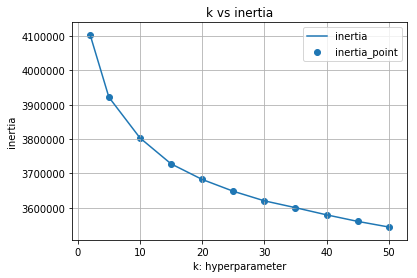

In [64]:
plt.plot(range_n_clusters, inertia, label='inertia')
plt.scatter(range_n_clusters, inertia, label='inertia_point')

plt.legend()
plt.xlabel("k: hyperparameter")
plt.ylabel("inertia")
plt.title("k vs inertia")
plt.grid()
plt.show()

In [65]:
# In above plot(k vs inertia) using elbow-knee method optimal k can be choosen from knee point.So we can get knee point at k=10
# best_k = 10

In [66]:
kmeans = KMeans(n_clusters=10, n_jobs=-1).fit(X2)

#creating dictionary for cluster_labels of datapoints.
#In mydict "key" are representing cluster_label and "value" are representing number of datapoints belonging to corresponding clustes
mydict = {i: np.where(kmeans.labels_ == i)[0] for i in range(kmeans.n_clusters)}
mydict

{0: array([    8,    32,    36, ..., 29983, 29990, 29999]),
 1: array([   19,    28,    42, ..., 29962, 29987, 29988]),
 2: array([    2,     4,     6, ..., 29993, 29995, 29997]),
 3: array([   33,    37,    50,    54,    56,    97,   120,   138,   184,
          217,   331,   379,   410,   462,   501,   513,   523,   545,
          549,   619,   694,   793,   817,   882,   883,   909,   952,
          981,  1230,  1246,  1256,  1313,  1395,  1458,  1477,  1508,
         1576,  1644,  1688,  1711,  1771,  1793,  1842,  1863,  1909,
         1972,  1989,  2018,  2088,  2111,  2218,  2240,  2275,  2283,
         2300,  2303,  2335,  2343,  2360,  2587,  2625,  2761,  2833,
         2835,  2864,  2894,  2903,  3019,  3066,  3150,  3156,  3207,
         3311,  3363,  3414,  3462,  3545,  3704,  3807,  3890,  3906,
         3916,  3928,  4066,  4087,  4110,  4184,  4242,  4278,  4425,
         4455,  4474,  4543,  4560,  4561,  4593,  4602,  4635,  4656,
         4667,  4794,  4795,  4817, 

In [67]:
#In mydict1 "key" is representing cluster_label and "value" is representing total datapoints belonging to corresponding cluster
mydict1 = {i: np.where(kmeans.labels_ == i)[0].shape for i in range(kmeans.n_clusters)}
mydict1

{0: (1585,),
 1: (3313,),
 2: (6665,),
 3: (503,),
 4: (2602,),
 5: (2079,),
 6: (2555,),
 7: (6411,),
 8: (2756,),
 9: (1531,)}

In [ ]:
#we will select only top 5 cluster which has high number of datapoints to that cluster.
#cluster_labels 2,7,1,8,4 are top 5 clusters having high datapoints

<h3>word cloud for cluster 1</h3>

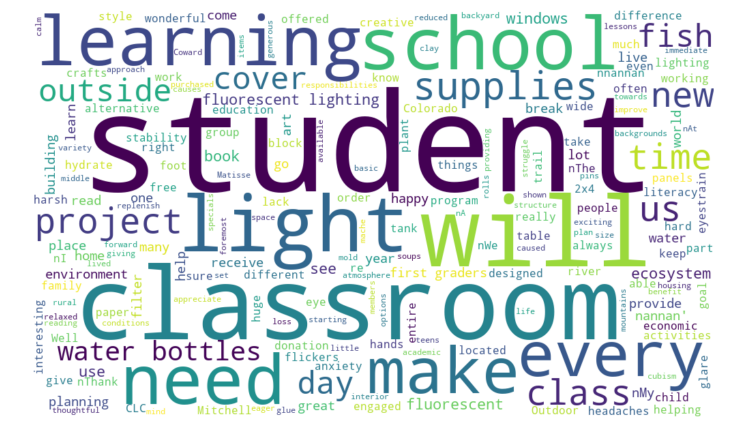

In [71]:
X['cluster_label'] = kmeans.labels_
text_data = X.loc[(X['cluster_label']==2), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like learning, student, classroom, light, will, need, every and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 2</h3>

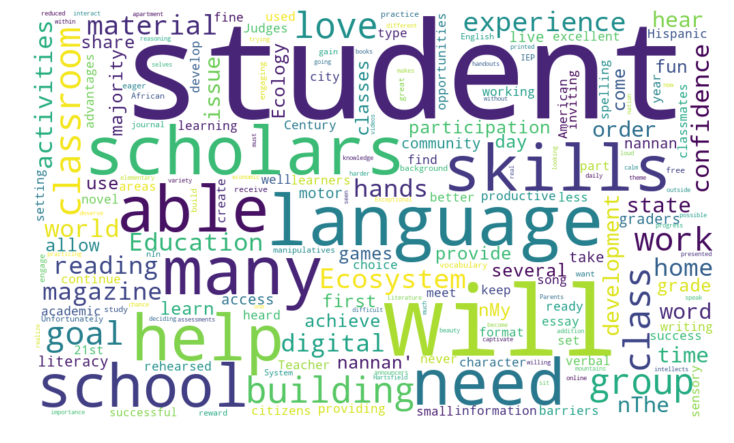

In [72]:
text_data = X.loc[(X['cluster_label']==7), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, scholars, skills, language, will, help, need and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 3</h3>

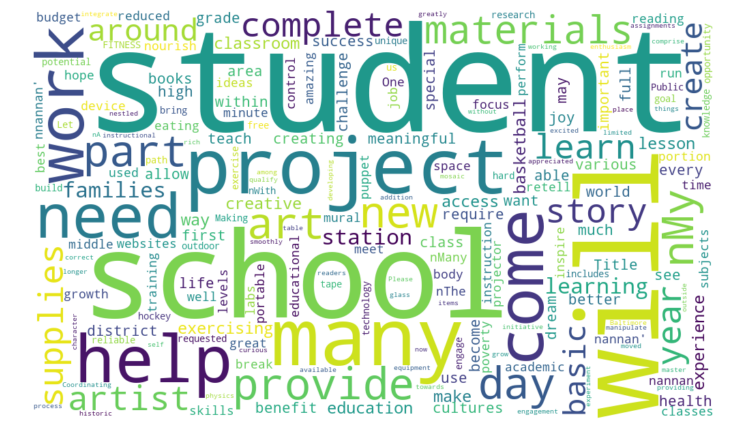

In [73]:
text_data = X.loc[(X['cluster_label']==1), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, project, school, will, many, help, work, need and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 4</h3>

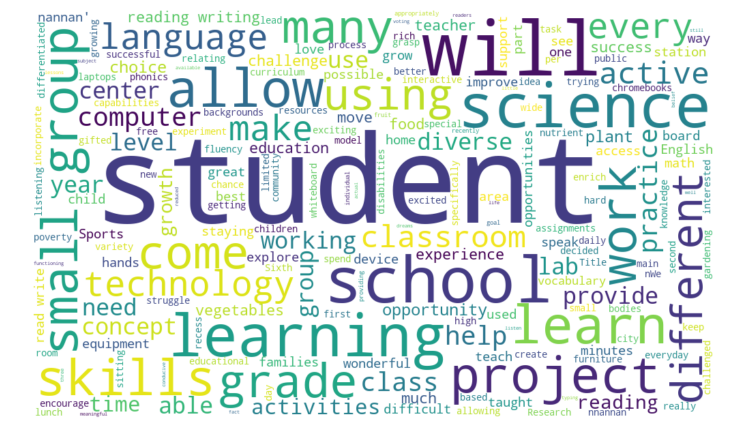

In [74]:
text_data = X.loc[(X['cluster_label']==8), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, will, school, learning, project, skills, science and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 5</h3>

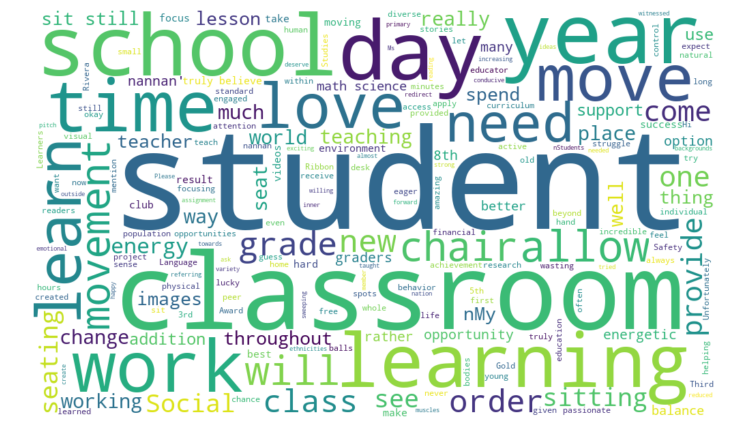

In [75]:
text_data = X.loc[(X['cluster_label']==4), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, school, day, year, time, work, learning, love, and many more
#are highlighted which means these words are very frequent in this cluster

In [84]:
#I am considering 10k data points for Agglomerative clustering.
X = project_data.sample(10000) 
Y = X['project_is_approved'].values

<h3>2.2.1 Normalizing the numerical features: Price</h3>

In [85]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X['price'].values.reshape(-1,1))

price_norm = normalizer.transform(X['price'].values.reshape(-1,1))

print("After vectorizations")
print(price_norm.shape)

After vectorizations
(10000, 1)


<h3>2.2.2 Normalizing the numerical features: teacher_number_of_previously_posted_projects</h3>

In [86]:
normalizer.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

tnppp_norm = normalizer.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After vectorizations")
print(tnppp_norm.shape)

After vectorizations
(10000, 1)


<h3>2.2.3 one hot encoding the catogorical features:clean_categories</h3>

In [87]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['clean_categories'].values)

categories_ohe = vectorizer.transform(X['clean_categories'].values)
print("After vectorizations")
print(categories_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(10000, 9)
['Music_Arts', 'Care_Hunger', 'AppliedLearning', 'SpecialNeeds', 'Warmth', 'Math_Science', 'Literacy_Language', 'Health_Sports', 'History_Civics']


<h3>2.2.4 one hot encoding the catogorical features: clean_subcategories</h3>

In [88]:
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['clean_subcategories'].values)
sub_categories_ohe = vectorizer.transform(X['clean_subcategories'].values)
print("After vectorizations")
print(sub_categories_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(10000, 30)
['TeamSports', 'AppliedSciences', 'Other', 'Literacy', 'PerformingArts', 'Extracurricular', 'Health_Wellness', 'EnvironmentalScience', 'FinancialLiteracy', 'SocialSciences', 'Mathematics', 'Warmth', 'ESL', 'Gym_Fitness', 'CommunityService', 'Music', 'CharacterEducation', 'ForeignLanguages', 'Health_LifeScience', 'SpecialNeeds', 'College_CareerPrep', 'Literature_Writing', 'ParentInvolvement', 'Economics', 'Care_Hunger', 'Civics_Government', 'VisualArts', 'NutritionEducation', 'EarlyDevelopment', 'History_Geography']


<h3>2.2.5 one hot encoding the catogorical features: school_state</h3>

In [89]:
vectorizer = CountVectorizer()
vectorizer.fit(X['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
state_ohe = vectorizer.transform(X['school_state'].values)
print("After vectorizations")
print(state_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(10000, 51)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


<h3>2.2.6 one hot encoding the catogorical features: teacher_prefix</h3>

In [90]:
vectorizer.fit(X['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
teacher_ohe = vectorizer.transform(X['teacher_prefix'].values)
print("After vectorizations")
print(teacher_ohe.shape)
print(vectorizer.get_feature_names())

After vectorizations
(10000, 5)
['dr', 'mr', 'mrs', 'ms', 'teacher']


<h3>2.2.7 one hot encoding the catogorical features: project_grade_category</h3>

In [91]:
#one hot encoding of project_grade_category for X_train
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in X['project_grade_category'].values:
    my_counter.update(word.split())
    
    
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
grade_dict = dict(my_counter)
sorted_grade_dict = dict(sorted(grade_dict.items(), key=lambda kv: kv[1]))

#https://thispointer.com/different-ways-to-remove-a-key-from-dictionary-in-python/
if "Grades" in sorted_grade_dict:
    del sorted_grade_dict["Grades"]


#Vectorizing Categorical data:project_grade_category

# we use count vectorizer to convert the values into one hot encoded features
vectorizer = CountVectorizer(vocabulary=list(sorted_grade_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X['project_grade_category'].values)
print(vectorizer.get_feature_names())


grade_ohe = vectorizer.transform(X['project_grade_category'].values)
print(grade_ohe.shape)

['9-12', '3-5', 'PreK-2', '6-8']
(10000, 4)


<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

<h3>2.3.1.1 Text preprocessing</h3>

In [92]:

from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(X['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 10000/10000 [00:06<00:00, 1517.12it/s]


<h3>2.3.1.2 Vectorizing Text data:Bag of words</h3>

In [93]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays) # fit has to happen only on train data

text_bow = vectorizer.transform(preprocessed_essays)
print("After vectorizations")
print(text_bow.shape)

After vectorizations
(10000, 6074)


<h3>2.3.2.1 Title preprocessing</h3>

In [94]:

from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(X['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles.append(sent.lower().strip())

100%|██████████| 10000/10000 [00:00<00:00, 35881.29it/s]


<h3>2.3.2.2 Vectorizing project_titles data:Bag of words</h3>

In [95]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_titles) # fit has to happen only on train data

titles_bow = vectorizer.transform(preprocessed_titles)

print("After vectorizations")
print(titles_bow.shape)

After vectorizations
(10000, 616)


<h3>Concatinating all the features:BOW</h3>

In [96]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X1 = hstack((price_norm, tnppp_norm, categories_ohe, sub_categories_ohe, state_ohe, teacher_ohe, grade_ohe, text_bow, titles_bow))
         
print("Final Data matrix")
print(X1.shape)

Final Data matrix
(10000, 6791)


In [97]:
from sklearn.feature_selection import SelectKBest, chi2

print(X1.shape)
print('='*50)
sel = SelectKBest(chi2, k=5000).fit(X1,Y)
X2 = sel.transform(X1)
print(X2.shape)

(10000, 6791)
(10000, 5000)


In [98]:
from scipy.sparse import hstack
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix

X2 = csr_matrix(X2)

<h2>2.6 Apply AgglomerativeClustering</h2>

In [99]:
#AgglomerativeClustering and word cloud with n_clusters=2
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=2).fit(X2.toarray())

In [100]:
#creating dictionary for cluster labels of datapoints
mydict = {i: np.where(cluster.labels_ == i)[0] for i in range(cluster.n_clusters)}
mydict

{0: array([   0,    1,    2, ..., 9997, 9998, 9999]),
 1: array([  14,   22,   31, ..., 9969, 9970, 9991])}

<h3>word cloud for cluster 1</h3>

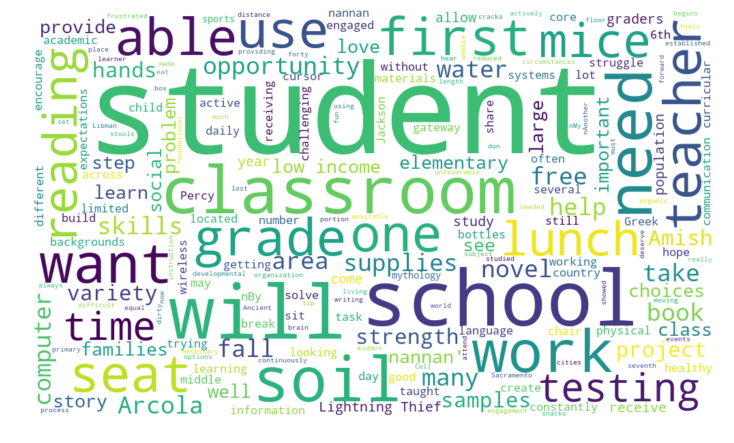

In [101]:
X['h_cluster_label'] = cluster.labels_
text_data = X.loc[(X['h_cluster_label']==0), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [102]:
#observation:In the above cluster we can see words like student, classroom, school, teacher, reading, soil, seat and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 2</h3>

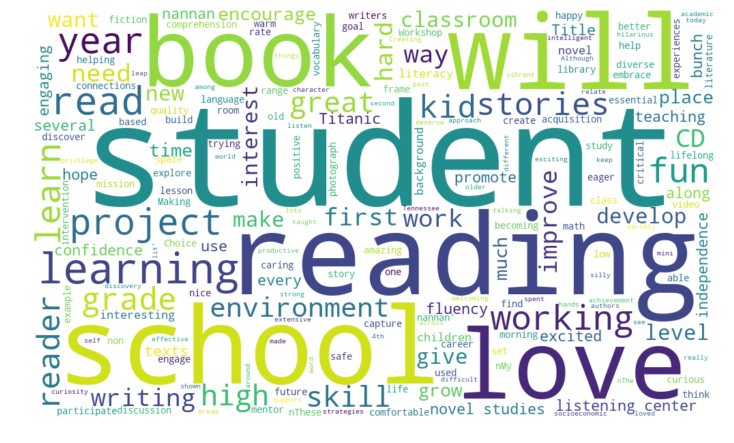

In [103]:
text_data = X.loc[(X['h_cluster_label']==1), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [104]:
#observation:In the above cluster we can see words like student, reading, school, love, book, will, learning and many more
#are highlighted which means these words are very frequent in this cluster

In [106]:
#AgglomerativeClustering and word cloud with n_clusters=5
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=5).fit(X2.toarray())

In [107]:
#creating dictionary for cluster labels of datapoints
mydict = {i: np.where(cluster.labels_ == i)[0] for i in range(cluster.n_clusters)}
mydict

{0: array([   3,   11,   21, ..., 9984, 9994, 9999]),
 1: array([   5,    6,    8, ..., 9968, 9987, 9992]),
 2: array([   7,   12,   16, ..., 9989, 9993, 9995]),
 3: array([  14,   22,   31, ..., 9969, 9970, 9991]),
 4: array([   0,    1,    2, ..., 9996, 9997, 9998])}

<h3>word cloud for cluster 1</h3>

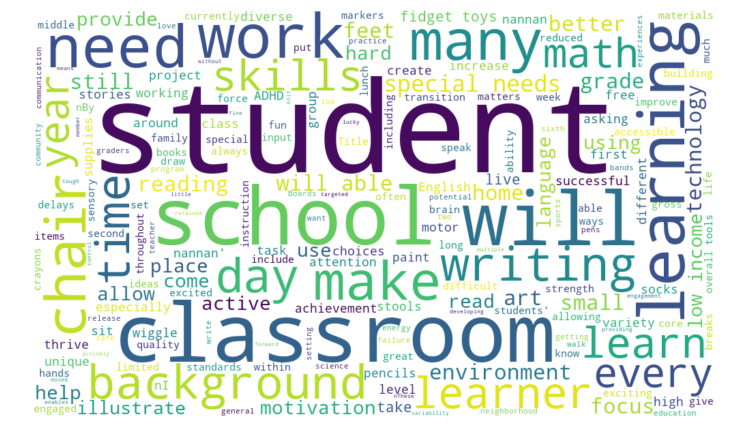

In [109]:
X['h_cluster_label'] = cluster.labels_
text_data = X.loc[(X['h_cluster_label']==0), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, need, work, classroom, chair, will, learning and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 2</h3>

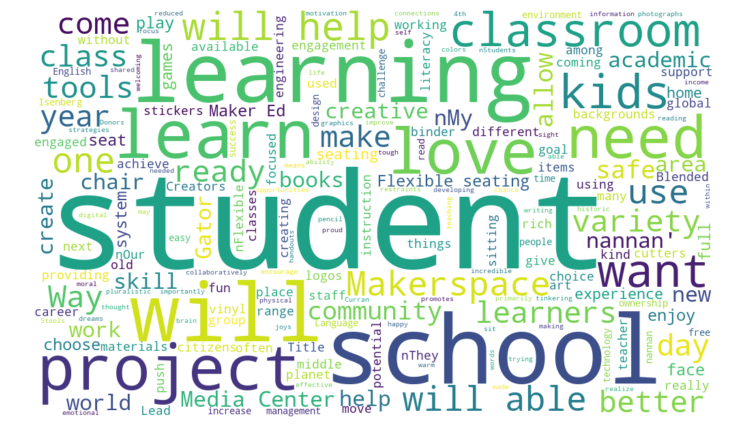

In [110]:
text_data = X.loc[(X['h_cluster_label']==1), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like learning, student, classroom, project, school, learn, love and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 3</h3>

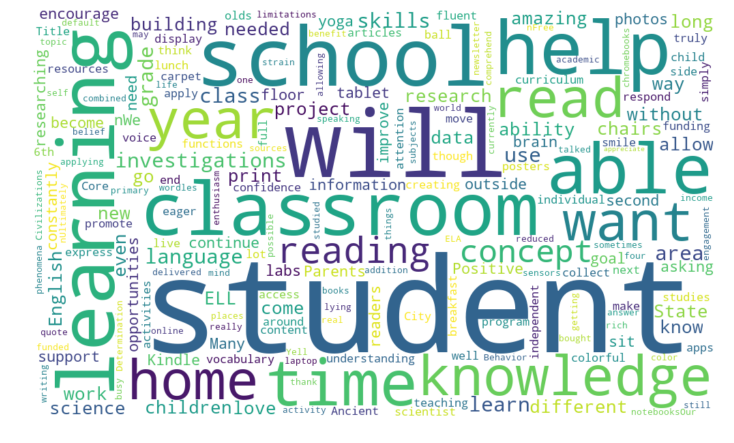

In [111]:
text_data = X.loc[(X['h_cluster_label']==2), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, classroom, learning, will, able, home, time, year and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 4</h3>

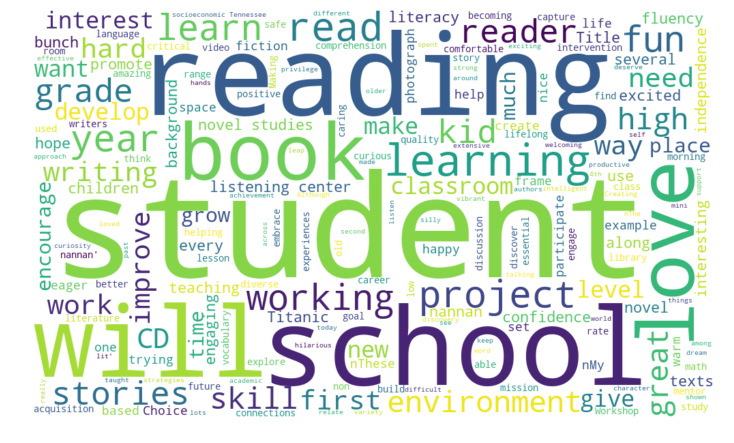

In [112]:
text_data = X.loc[(X['h_cluster_label']==3), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like reading, student, school, will, book, love, learning and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 5</h3>

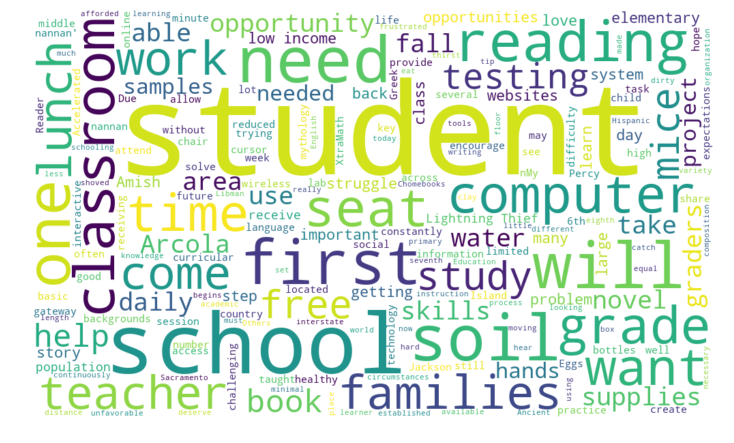

In [113]:
text_data = X.loc[(X['h_cluster_label']==4), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, school, classroom, need, families, soil, need,  and many more
#are highlighted which means these words are very frequent in this cluster

In [126]:
#AgglomerativeClustering and word cloud for n_clusters = 10
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=10).fit(X2.toarray())

In [127]:
#creating dictionary for cluster labels of datapoints
mydict = {i: np.where(cluster.labels_ == i)[0] for i in range(cluster.n_clusters)}
mydict

{0: array([   0,    1,    2, ..., 9990, 9997, 9998]),
 1: array([   6,    8,   20, ..., 9968, 9987, 9992]),
 2: array([   7,   12,   16, ..., 9989, 9993, 9995]),
 3: array([  37,  113,  117,  124,  172,  196,  272,  298,  328,  329,  409,
         429,  442,  454,  461,  474,  479,  486,  609,  626,  628,  642,
         649,  654,  660,  685,  705,  728,  793,  814,  815,  910,  943,
         952,  986,  993, 1012, 1014, 1105, 1124, 1134, 1146, 1147, 1172,
        1250, 1272, 1301, 1349, 1393, 1399, 1431, 1436, 1442, 1445, 1491,
        1504, 1534, 1538, 1546, 1566, 1625, 1693, 1698, 1709, 1735, 1807,
        1818, 1833, 1888, 1892, 1912, 1955, 1974, 2061, 2104, 2121, 2179,
        2193, 2199, 2216, 2218, 2253, 2265, 2268, 2286, 2290, 2344, 2384,
        2408, 2467, 2527, 2610, 2616, 2675, 2688, 2702, 2720, 2721, 2764,
        2780, 2818, 2832, 2841, 2857, 2869, 2884, 2916, 2918, 2920, 2943,
        2988, 3018, 3077, 3086, 3113, 3142, 3162, 3182, 3196, 3205, 3246,
        3252, 3260, 3

In [128]:
#In mydict1 "key" is representing cluster_label and "value" is representing total datapoints belonging to corresponding cluster
mydict1 = {i: np.where(cluster.labels_ == i)[0].shape for i in range(cluster.n_clusters)}
mydict1

{0: (2257,),
 1: (1775,),
 2: (2388,),
 3: (404,),
 4: (686,),
 5: (500,),
 6: (209,),
 7: (227,),
 8: (865,),
 9: (689,)}

In [129]:
#we will select only top 5 cluster which has high number of datapoints to that cluster.
#cluster_labels 2,0,1,8,9 are top 5 clusters having high datapoints

<h3>word cloud for cluster 1</h3>

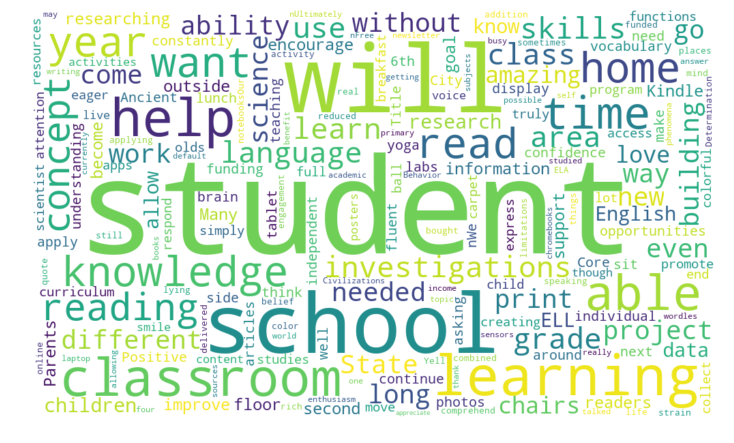

In [130]:
X['h_cluster_label'] = cluster.labels_
text_data = X.loc[(X['h_cluster_label']==2), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, will, school, classroom, learning, help and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 2</h3>

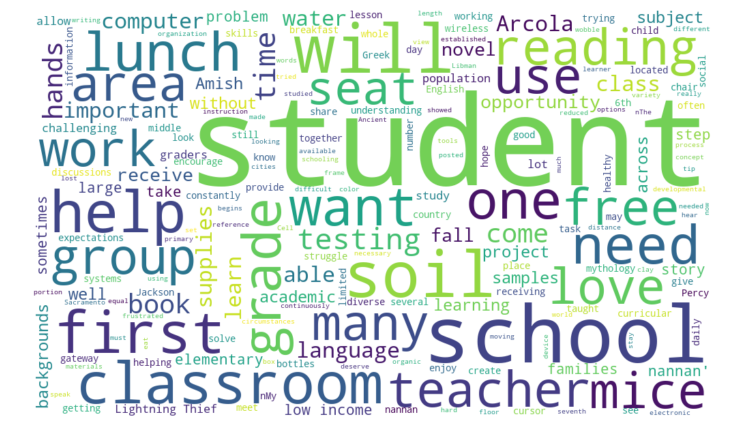

In [132]:
text_data = X.loc[(X['h_cluster_label']==0), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observationIn the above cluster we can see words like student, school, teacher, classroom, lunch, help, first, and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 3</h3>

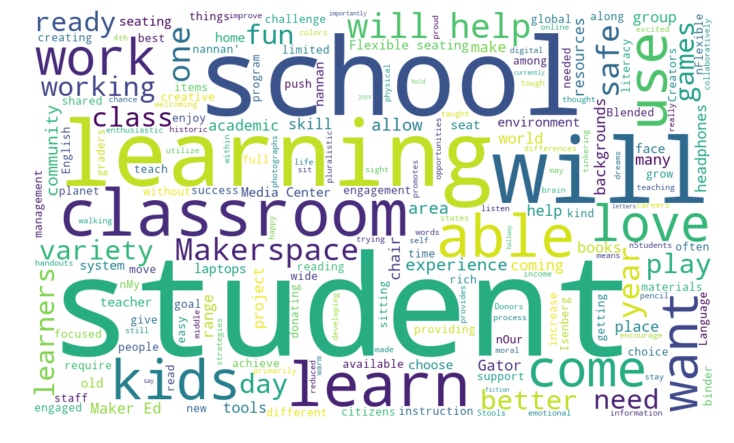

In [133]:
text_data = X.loc[(X['h_cluster_label']==1), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, learning, school, classroom, will, learn, kids and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 4</h3>

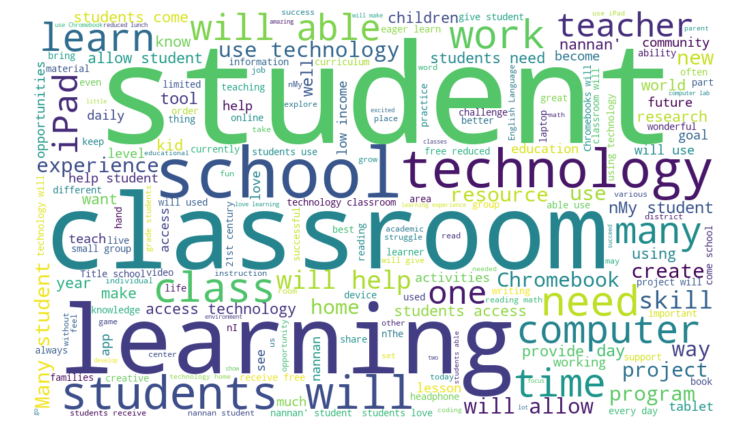

In [134]:
text_data = X.loc[(X['h_cluster_label']==8), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, learning, classroom, technology, school, students, and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 5</h3>

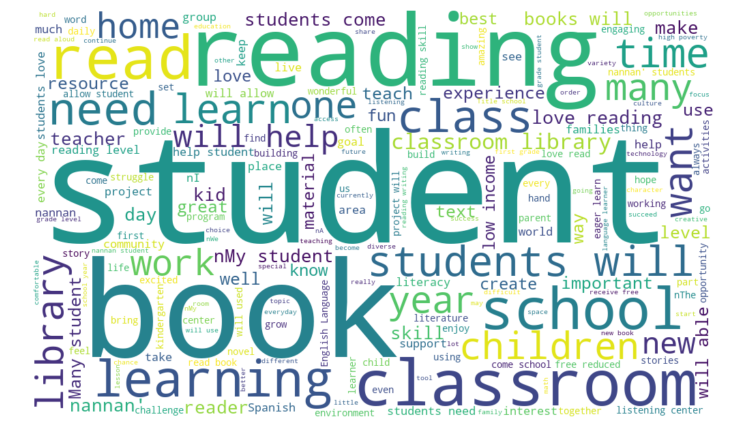

In [135]:
text_data = X.loc[(X['h_cluster_label']==9), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, reading, book, classroom, read, learning, school and many more
#are highlighted which means these words are very frequent in this cluster

In [118]:
#AgglomerativeClustering for n_clusters=15 and word cloud for these clusters
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=15).fit(X2.toarray())

In [120]:
#In mydict1 "key" is representing cluster_label and "value" is representing total datapoints belonging to corresponding cluster
mydict1 = {i: np.where(cluster.labels_ == i)[0].shape for i in range(cluster.n_clusters)}
mydict1

{0: (404,),
 1: (686,),
 2: (1616,),
 3: (1197,),
 4: (1100,),
 5: (668,),
 6: (313,),
 7: (227,),
 8: (865,),
 9: (689,),
 10: (176,),
 11: (500,),
 12: (1191,),
 13: (159,),
 14: (209,)}

In [ ]:
#we will select only top 5 cluster which has high number of datapoints to that cluster.
#cluster_labels 2,3,12,4,8 are top 5 clusters having high datapoints

<h3>word cloud for cluster 1</h3>

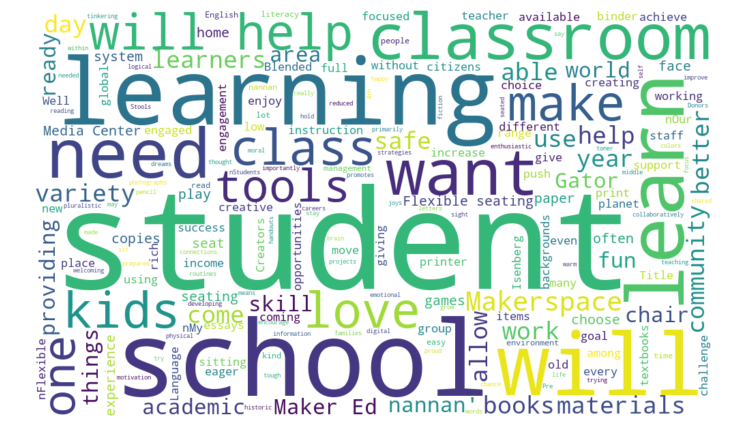

In [121]:
X['h_cluster_label'] = cluster.labels_
text_data = X.loc[(X['h_cluster_label']==2), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, learning, classroom, school, need, learn, will and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 2</h3>

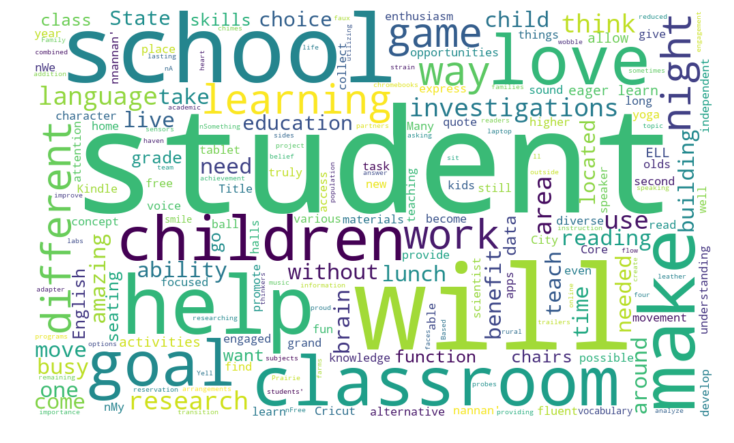

In [122]:
text_data = X.loc[(X['h_cluster_label']==3), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, school, children, will, classroom, make, help, goal and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 3</h3>

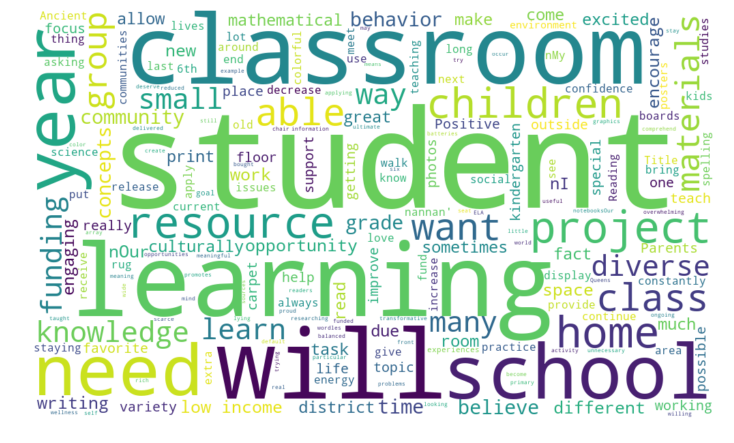

In [123]:
text_data = X.loc[(X['h_cluster_label']==12), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, learning, will, school, need, year, classroom, and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 4</h3>

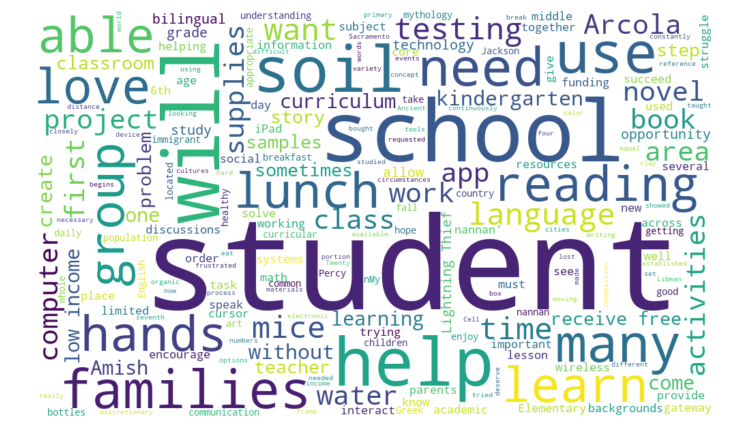

In [124]:
text_data = X.loc[(X['h_cluster_label']==4), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, will, school, help, families, soil, learn, love and many more
#are highlighted which means these words are very frequent in this cluster

<h3>word cloud for cluster 5</h3>

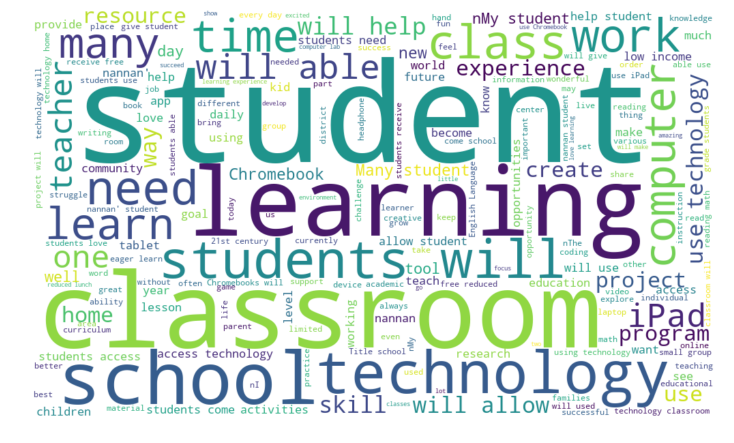

In [125]:
text_data = X.loc[(X['h_cluster_label']==8), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, learning, classroom, school, technology, students and many more
#are highlighted which means these words are very frequent in this cluster

<h2>2.7 Apply DBSCAN</h2>

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [76]:
#I am selecting n_neighbors =100 because i have selected min_pts = 100 in dbscan algorithm
from sklearn.neighbors import NearestNeighbors

nbrs = NearestNeighbors(n_neighbors=100).fit(X2)
distances, indices = nbrs.kneighbors(X2)

In [77]:
my_distances = distances[:,99]
my_dist = my_distances.tolist()
my_dist.sort()

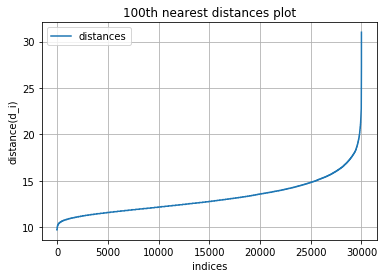

In [78]:
plt.plot(my_dist,label='distances')
plt.legend()
plt.xlabel("indices")
plt.ylabel("distance(d_i)")
plt.title("100th nearest distances plot")
plt.grid()
plt.show()

In [79]:
from sklearn.cluster import DBSCAN

clustering = DBSCAN(eps=17, min_samples=100, n_jobs=-1).fit(X2)

In [82]:
X['h_cluster_label'] = clustering.labels_
X['h_cluster_label'].unique()

array([ 0, -1])

In [ ]:
#we are seeing only one cluster and -1 is indication for noisy points

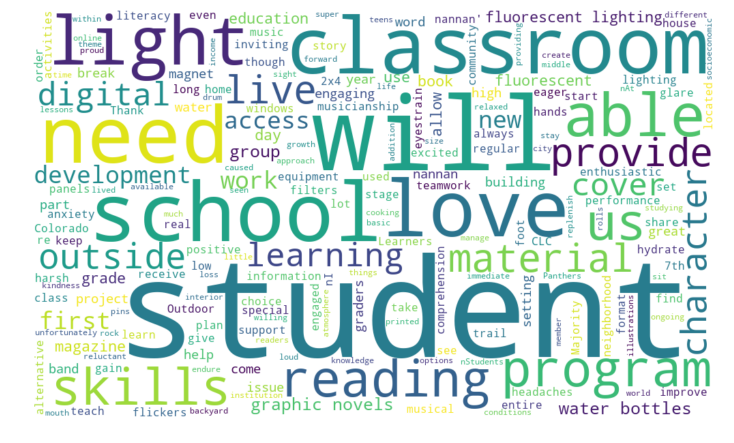

In [83]:
text_data = X.loc[(X['h_cluster_label']==0), 'essay'].values

#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 1000,
    height = 600,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_data))
fig = plt.figure(
    figsize = (10, 10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
#observation:In the above cluster we can see words like student, school, need, classroom, will able, program, skills and many more
#are highlighted which means these words are very frequent in this cluster

<h1>3. Cocnlusions</h1>
<br> Please write down few lines of your observations on this assignment.

<h4>1.In the word cloud of each and every cluster we can see many words are highlighted which means these words are very
frequent in that cluster</h4>
<h4>2.we can see  many frequent words in word cloud of one cluster are also frequent in word cloud of other cluster.Which 
indicates that one cluster is not different from other cluster on the basis of feature essay & title text.It seems that clusters
are different on the basis of other features in datasets</h4>
<h4>3.DBSCAN algorithm is very efficient and powerful in compare with Agglomerative and k-means</h4>
<h4>4.In this assignment, I have learnt how to do unsupervised modelling.This modelling technique will help to analysis those
datasets which have no y_label</h4>


In [5]:
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Vectorizer", "Clustering Algorithm", "Hyper Parameter(n_clusters)", "No. of clusters formed"]

x.add_row(["BOW", "K-means", 10, 10])
x.add_row(["BOW", "Agglomerative", 5, 5])
print(x)

+------------+----------------------+-----------------------------+------------------------+
| Vectorizer | Clustering Algorithm | Hyper Parameter(n_clusters) | No. of clusters formed |
+------------+----------------------+-----------------------------+------------------------+
|    BOW     |       K-means        |              10             |           10           |
|    BOW     |    Agglomerative     |              5              |           5            |
+------------+----------------------+-----------------------------+------------------------+


In [6]:
x = PrettyTable()

x.field_names = ["Vectorizer", "Clustering Algorithm", "eps", "min_sample", "No. of clusters formed"]

x.add_row(["BOW", "DBSCAN", 17, 100, 1])
print(x)

+------------+----------------------+-----+------------+------------------------+
| Vectorizer | Clustering Algorithm | eps | min_sample | No. of clusters formed |
+------------+----------------------+-----+------------+------------------------+
|    BOW     |        DBSCAN        |  17 |    100     |           1            |
+------------+----------------------+-----+------------+------------------------+
